In [1]:
import pandas as pd
import numpy as np


In [2]:
df=pd.read_csv("diabetes.csv")
print(df.head())
print(df.shape)

   Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0            6      148             72             35        0  33.6   
1            1       85             66             29        0  26.6   
2            8      183             64              0        0  23.3   
3            1       89             66             23       94  28.1   
4            0      137             40             35      168  43.1   

   DiabetesPedigreeFunction  Age  Outcome  
0                     0.627   50        1  
1                     0.351   31        0  
2                     0.672   32        1  
3                     0.167   21        0  
4                     2.288   33        1  
(768, 9)


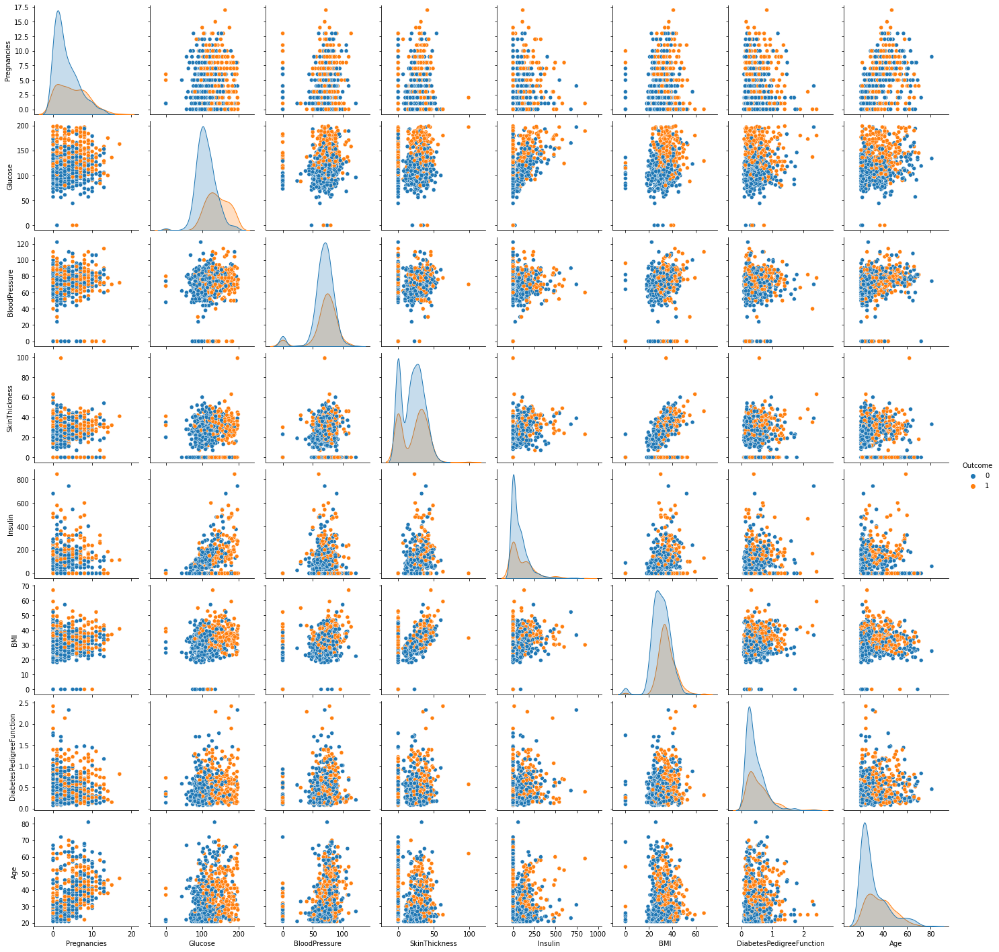

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.pairplot(df,hue="Outcome")

<AxesSubplot:>

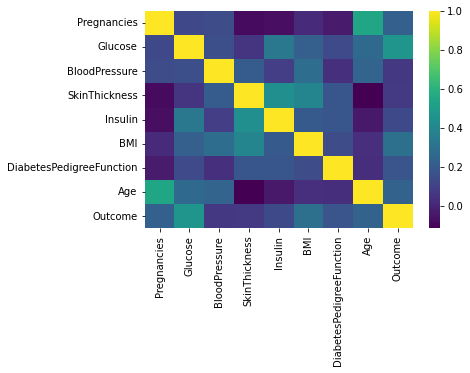

In [4]:
sns.heatmap(df.corr(), cmap='viridis')

In [5]:
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #I

In [7]:

X = df.drop(df.columns[-1], axis=1) # Features
y = df[df.columns[-1]]

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1) # 70% training and 30% test


In [18]:
clf = DecisionTreeClassifier(criterion="entropy")

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [19]:
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))


Accuracy: 0.6883116883116883


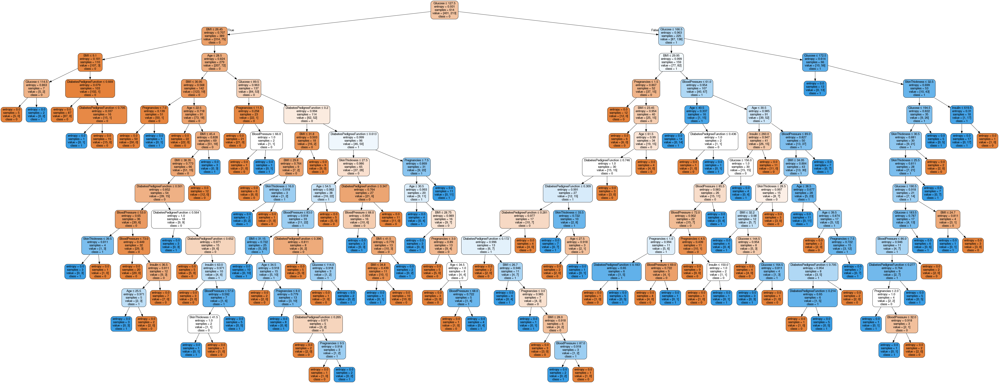

In [20]:
from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X.columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('diabetes_sklearn_entropy.png')
Image(graph.create_png())

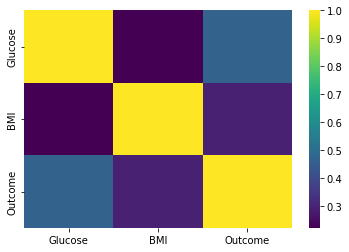

In [25]:
reduced_df=df[['Glucose','BMI','Outcome']]
snsplot=sns.heatmap(reduced_df.corr(), cmap='viridis')
import matplotlib.pyplot as plt
plt.savefig('correlation_heatmap.png')